## Haar Cascade for Face Detection 

In [2]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as img
from PIL import Image
import cv2

### Frontal (close-up) 

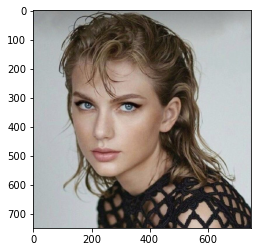

In [3]:
image = img.imread('C:\\Users\\Florence\\CompVision\\Face Detection\\img\\frontal.jpg')
plt.imshow(image)

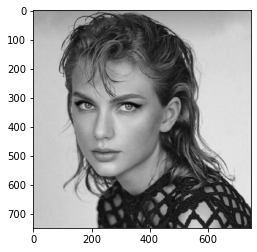

In [4]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

#plt.figure(figsize=(20,10))
plt.imshow(gray, cmap='gray')

In [5]:
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

In [6]:
faces = face_cascade.detectMultiScale(gray, 4,6)

In [7]:
print('HaarCascade found' + str(len(faces)) + ' faces in this image')

HaarCascade found1 faces in this image


In [8]:
img_with_detections = np.copy(image)

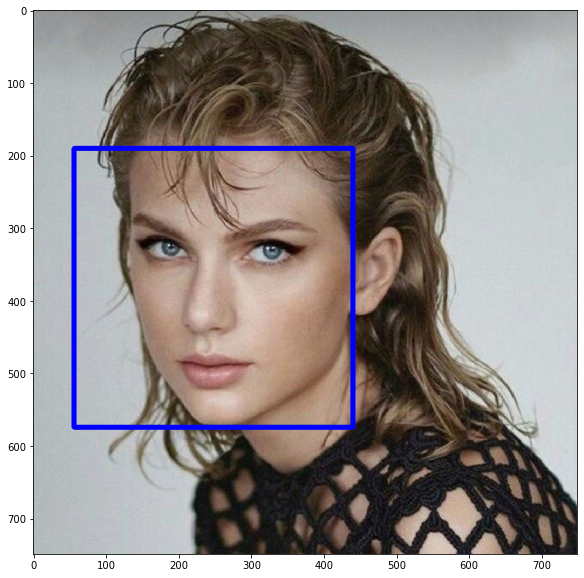

In [9]:
for (x,y,w,h) in faces:
    cv2.rectangle(img_with_detections,(x,y),(x+w,y+h),(0,0,255),5)
plt.figure(figsize=(20,10))
plt.imshow(img_with_detections)

### Haar Cascade and Inceptionv3 for Face Classification 

In [10]:
import time
from tensorflow.keras.models import load_model
import pickle

In [11]:
#load trained model
model = load_model('C:\\Users\\Florence\\CompVision\\Face Detection\\facedetector-model.h5')

In [12]:
#load Labels
labels = ""
with open('C:\\Users\\Florence\\CompVision\\Face Detection\\labels.pkl', 'rb') as pf:
    labels = pickle.load(pf)
labels

{0: 'face'}

In [13]:
img_size = (150,150) #set image size

In [14]:
img_with_prediction = np.copy(image)

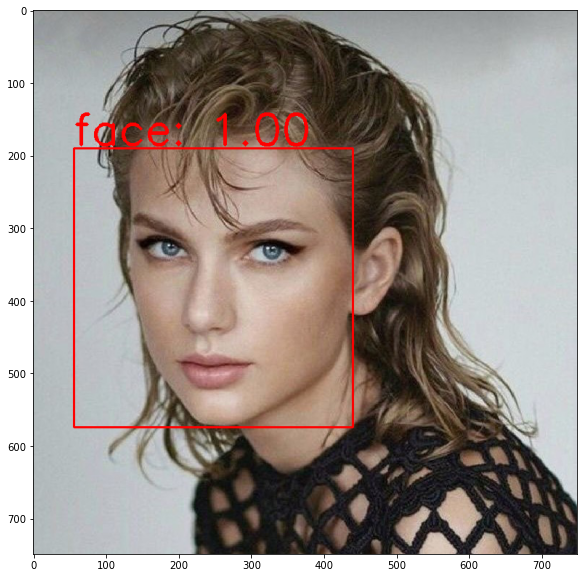

In [15]:
for (x,y,w,h) in faces:
    roi = img_with_prediction[y : y+h, x : x+w] #get region of interest
    data = cv2.resize(roi, img_size)/ 255. #resize image and flatten
    data = data.reshape((1,) + data.shape) #reshape the data to fit model
    scores = model.predict(data) #predict
    target = np.argmax(scores, axis=1)[0]
    
    cv2.rectangle(img=img_with_prediction, pt1=(x, y), pt2=(x+w, y+h), color=(255, 0, 0), thickness=2)
    text = "{}: {:.2f}".format(labels[target], scores[0][target])
    cv2.putText(img_with_prediction, text, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX,2, (255,0,0), 4)

plt.figure(figsize=(20,10))
plt.imshow(img_with_prediction)

### Frontal (not close-up)

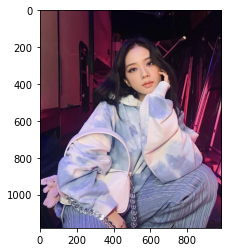

In [16]:
image = img.imread('C:\\Users\\Florence\\CompVision\\Face Detection\\img\\frontal2.jpg')
plt.imshow(image)

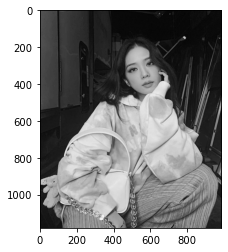

In [17]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

#plt.figure(figsize=(20,10))
plt.imshow(gray, cmap='gray')

In [18]:
faces = face_cascade.detectMultiScale(gray,4,5)

In [19]:
print('HaarCascade found' + str(len(faces)) + ' faces in this image')

HaarCascade found0 faces in this image


In [20]:
img_with_detections = np.copy(image)

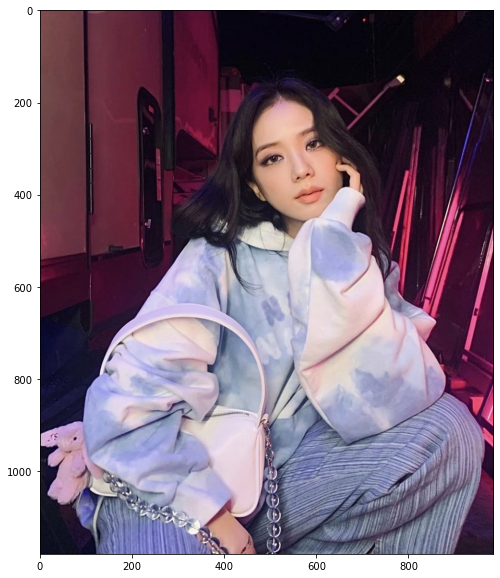

In [21]:
for (x,y,w,h) in faces:
    cv2.rectangle(img_with_detections,(x,y),(x+w,y+h),(0,0,255),5)
plt.figure(figsize=(20,10))
plt.imshow(img_with_detections)

In [22]:
img_with_prediction = np.copy(image)

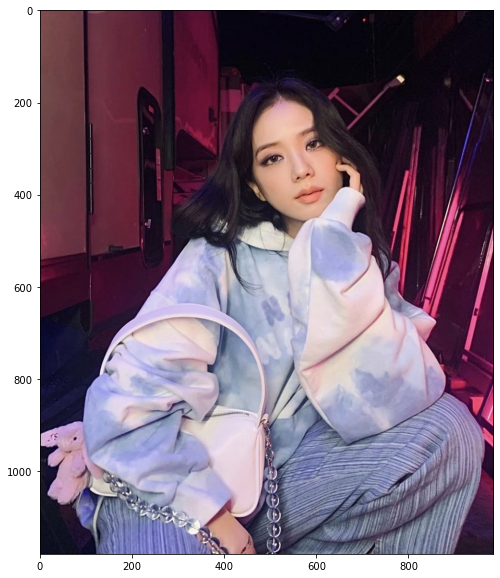

In [23]:
for (x,y,w,h) in faces:
    roi = img_with_prediction[y : y+h, x : x+w] #get region of interest
    data = cv2.resize(roi, img_size)/ 255. #resize image and flatten
    data = data.reshape((1,) + data.shape) #reshape the data to fit model
    scores = model.predict(data) #predict
    target = np.argmax(scores, axis=1)[0]
    
    cv2.rectangle(img=img_with_prediction, pt1=(x, y), pt2=(x+w, y+h), color=(255, 0, 0), thickness=2)
    text = "{}: {:.2f}".format(labels[target], scores[0][target])
    cv2.putText(img_with_prediction, text, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX,2, (255,0,0), 4)

plt.figure(figsize=(20,10))
plt.imshow(img_with_prediction)

### Occlusion 

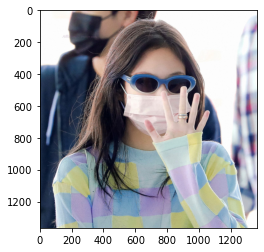

In [24]:
image = img.imread('C:\\Users\\Florence\\CompVision\\Face Detection\\img\occlusion.jpg')
plt.imshow(image)

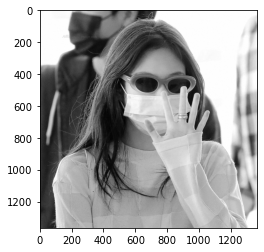

In [25]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

#plt.figure(figsize=(20,10))
plt.imshow(gray, cmap='gray')

In [26]:
faces = face_cascade.detectMultiScale(gray, 1.3,5)

In [27]:
print('HaarCascade found' + str(len(faces)) + ' faces in this image')

HaarCascade found1 faces in this image


In [28]:
img_with_detections = np.copy(image)

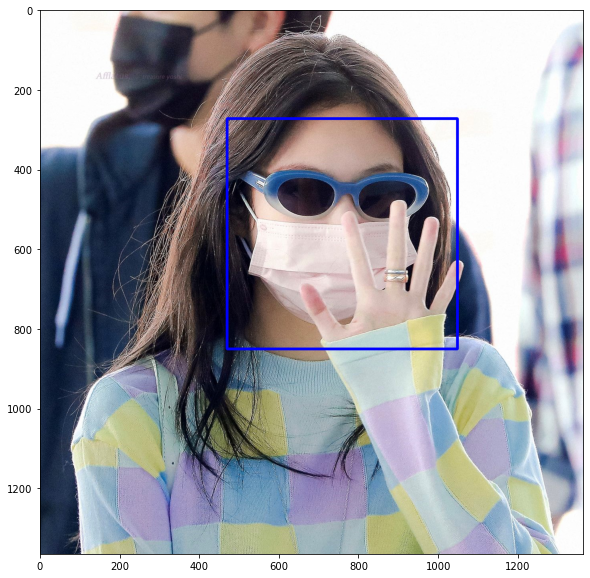

In [29]:
for (x,y,w,h) in faces:
    cv2.rectangle(img_with_detections,(x,y),(x+w,y+h),(0,0,255),5)
plt.figure(figsize=(20,10))
plt.imshow(img_with_detections)

In [30]:
img_with_prediction = np.copy(image)

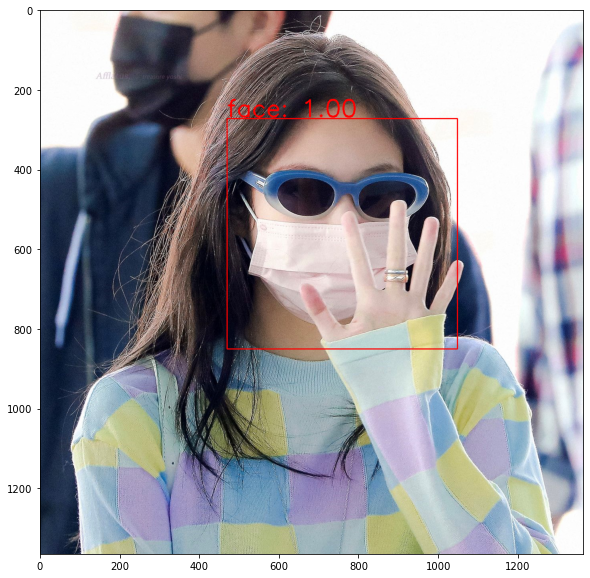

In [31]:
for (x,y,w,h) in faces:
    roi = img_with_prediction[y : y+h, x : x+w] #get region of interest
    data = cv2.resize(roi, img_size)/ 255. #resize image and flatten
    data = data.reshape((1,) + data.shape) #reshape the data to fit model
    scores = model.predict(data) #predict
    target = np.argmax(scores, axis=1)[0]
    
    cv2.rectangle(img=img_with_prediction, pt1=(x, y), pt2=(x+w, y+h), color=(255, 0, 0), thickness=2)
    text = "{}: {:.2f}".format(labels[target], scores[0][target])
    cv2.putText(img_with_prediction, text, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX,2, (255,0,0), 4)

plt.figure(figsize=(20,10))
plt.imshow(img_with_prediction)

### Occlusion (not close-up) 

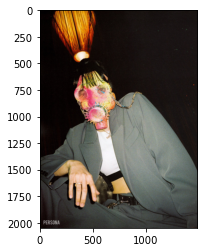

In [32]:
image = img.imread('C:\\Users\\Florence\\CompVision\\Face Detection\\img\occlusion2.jpg')
plt.imshow(image)

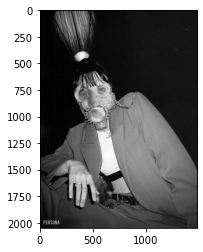

In [33]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

#plt.figure(figsize=(20,10))
plt.imshow(gray, cmap='gray')

In [34]:
faces = face_cascade.detectMultiScale(gray, 1.3,5)

In [35]:
print('HaarCascade found' + str(len(faces)) + ' faces in this image')

HaarCascade found1 faces in this image


In [36]:
img_with_detections = np.copy(image)

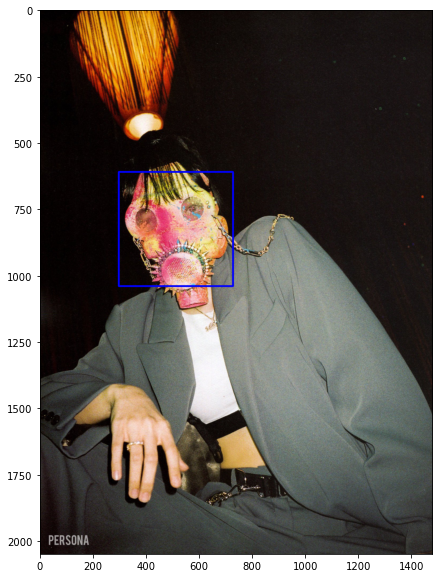

In [37]:
for (x,y,w,h) in faces:
    cv2.rectangle(img_with_detections,(x,y),(x+w,y+h),(0,0,255),5)
plt.figure(figsize=(20,10))
plt.imshow(img_with_detections)

In [38]:
img_with_prediction = np.copy(image)

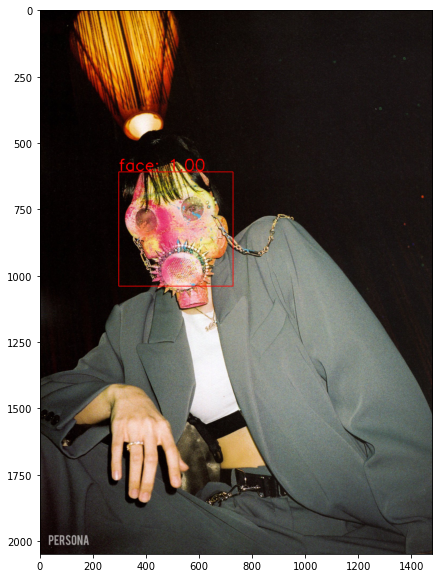

In [39]:
for (x,y,w,h) in faces:
    roi = img_with_prediction[y : y+h, x : x+w] #get region of interest
    data = cv2.resize(roi, img_size)/ 255. #resize image and flatten
    data = data.reshape((1,) + data.shape) #reshape the data to fit model
    scores = model.predict(data) #predict
    target = np.argmax(scores, axis=1)[0]
    
    cv2.rectangle(img=img_with_prediction, pt1=(x, y), pt2=(x+w, y+h), color=(255, 0, 0), thickness=2)
    text = "{}: {:.2f}".format(labels[target], scores[0][target])
    cv2.putText(img_with_prediction, text, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX,2, (255,0,0), 4)

plt.figure(figsize=(20,10))
plt.imshow(img_with_prediction)

### Face Upward 

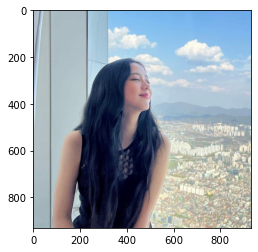

In [40]:
image = img.imread('C:\\Users\\Florence\\CompVision\\Face Detection\\img\\upward.jpg')
plt.imshow(image)

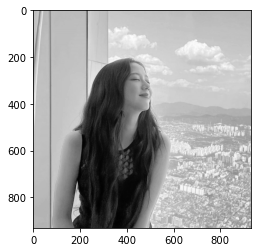

In [41]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

#plt.figure(figsize=(20,10))
plt.imshow(gray, cmap='gray')

In [42]:
faces = face_cascade.detectMultiScale(gray, 4,5)

In [43]:
print('HaarCascade found' + str(len(faces)) + ' faces in this image')

HaarCascade found0 faces in this image


In [44]:
img_with_detections = np.copy(image)

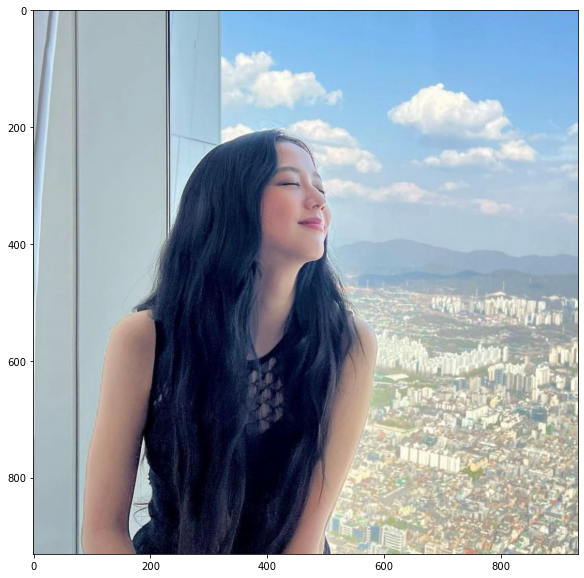

In [45]:
for (x,y,w,h) in faces:
    cv2.rectangle(img_with_detections,(x,y),(x+w,y+h),(0,0,255),5)
plt.figure(figsize=(20,10))
plt.imshow(img_with_detections)

In [46]:
img_with_prediction = np.copy(image)

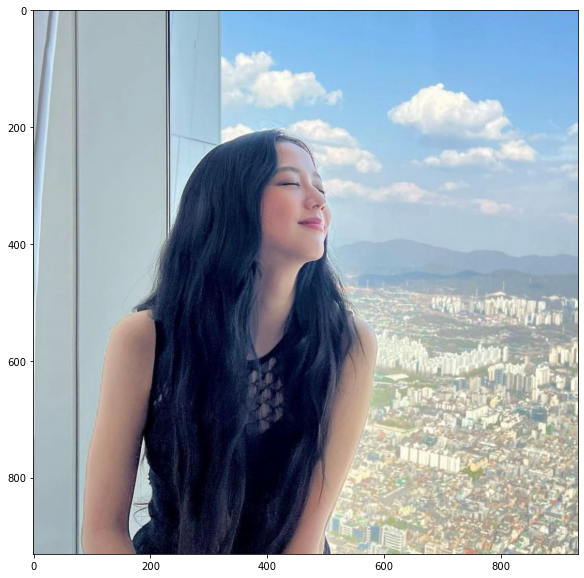

In [47]:
for (x,y,w,h) in faces:
    roi = img_with_prediction[y : y+h, x : x+w] #get region of interest
    data = cv2.resize(roi, img_size)/ 255. #resize image and flatten
    data = data.reshape((1,) + data.shape) #reshape the data to fit model
    scores = model.predict(data) #predict
    target = np.argmax(scores, axis=1)[0]
    
    cv2.rectangle(img=img_with_prediction, pt1=(x, y), pt2=(x+w, y+h), color=(255, 0, 0), thickness=2)
    text = "{}: {:.2f}".format(labels[target], scores[0][target])
    cv2.putText(img_with_prediction, text, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX,2, (255,0,0), 4)

plt.figure(figsize=(20,10))
plt.imshow(img_with_prediction)

### Face upward 

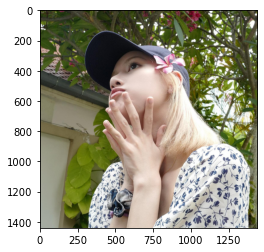

In [48]:
image = img.imread('C:\\Users\\Florence\\CompVision\\Face Detection\\img\\upward2.jpg')
plt.imshow(image)

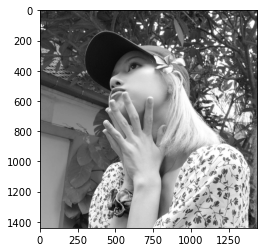

In [49]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

#plt.figure(figsize=(20,10))
plt.imshow(gray, cmap='gray')

In [50]:
faces = face_cascade.detectMultiScale(gray, 3,5)

In [51]:
print('HaarCascade found' + str(len(faces)) + ' faces in this image')

HaarCascade found0 faces in this image


In [52]:
img_with_detections = np.copy(image)

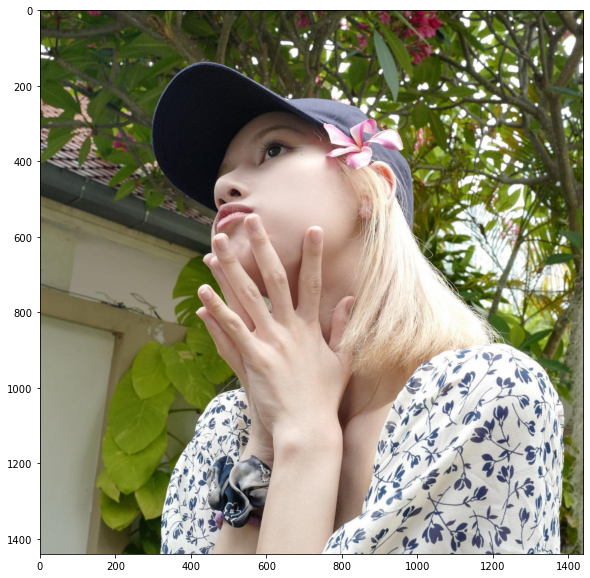

In [53]:
for (x,y,w,h) in faces:
    cv2.rectangle(img_with_detections,(x,y),(x+w,y+h),(0,0,255),5)
plt.figure(figsize=(20,10))
plt.imshow(img_with_detections)

In [54]:
img_with_prediction = np.copy(image)

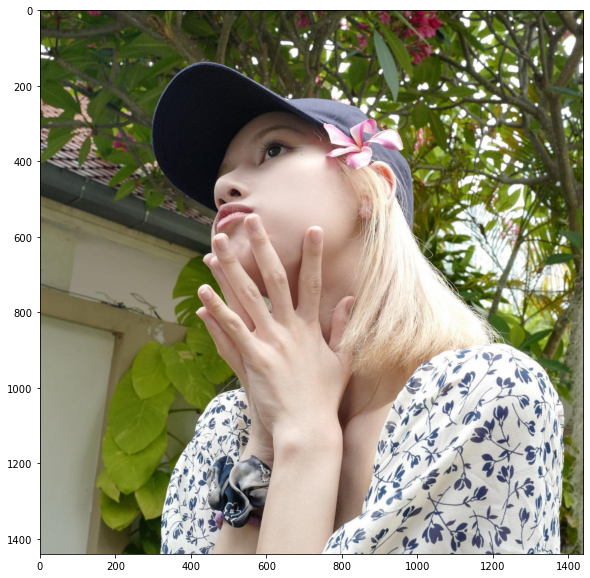

In [55]:
for (x,y,w,h) in faces:
    roi = img_with_prediction[y : y+h, x : x+w] #get region of interest
    data = cv2.resize(roi, img_size)/ 255. #resize image and flatten
    data = data.reshape((1,) + data.shape) #reshape the data to fit model
    scores = model.predict(data) #predict
    target = np.argmax(scores, axis=1)[0]
    
    cv2.rectangle(img=img_with_prediction, pt1=(x, y), pt2=(x+w, y+h), color=(255, 0, 0), thickness=2)
    text = "{}: {:.2f}".format(labels[target], scores[0][target])
    cv2.putText(img_with_prediction, text, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX,2, (255,0,0), 4)

plt.figure(figsize=(20,10))
plt.imshow(img_with_prediction)

### Face Downward

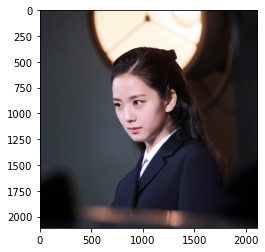

In [56]:
image = img.imread('C:\\Users\\Florence\\CompVision\\Face Detection\\img\\downward.jpg')
plt.imshow(image)

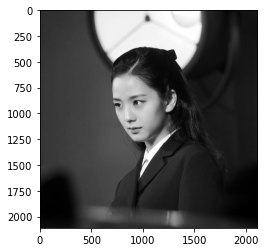

In [57]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

#plt.figure(figsize=(20,10))
plt.imshow(gray, cmap='gray')

In [58]:
faces = face_cascade.detectMultiScale(gray, 1.3,5)

In [59]:
print('HaarCascade found' + str(len(faces)) + ' faces in this image')

HaarCascade found1 faces in this image


In [60]:
img_with_detections = np.copy(image)

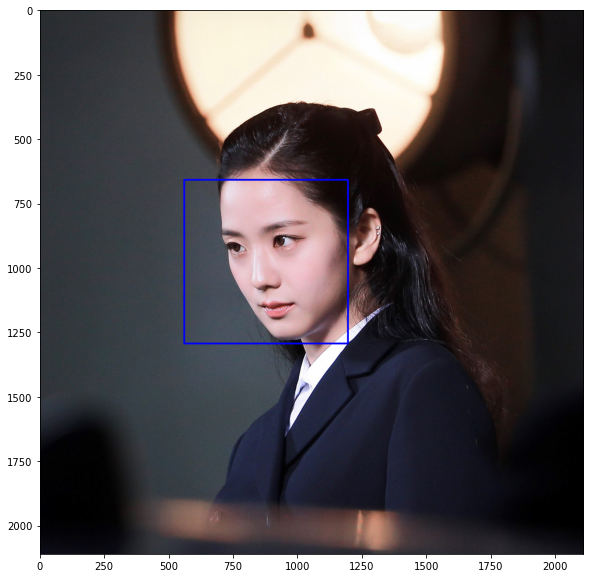

In [61]:
for (x,y,w,h) in faces:
    cv2.rectangle(img_with_detections,(x,y),(x+w,y+h),(0,0,255),5)
plt.figure(figsize=(20,10))
plt.imshow(img_with_detections)

In [62]:
img_with_prediction = np.copy(image)

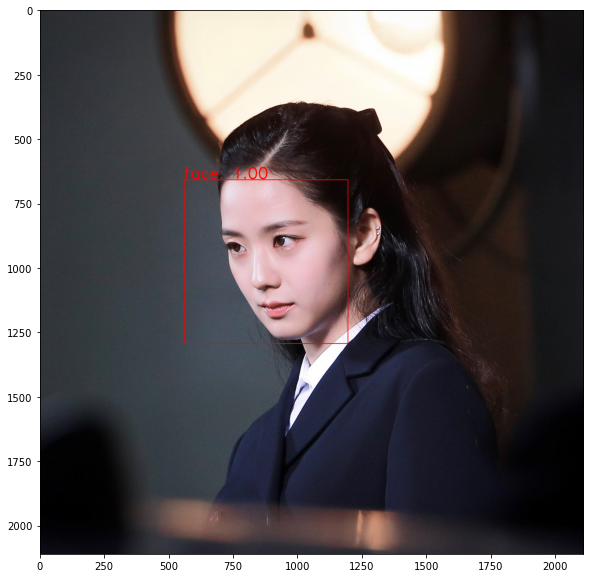

In [63]:
for (x,y,w,h) in faces:
    roi = img_with_prediction[y : y+h, x : x+w] #get region of interest
    data = cv2.resize(roi, img_size)/ 255. #resize image and flatten
    data = data.reshape((1,) + data.shape) #reshape the data to fit model
    scores = model.predict(data) #predict
    target = np.argmax(scores, axis=1)[0]
    
    cv2.rectangle(img=img_with_prediction, pt1=(x, y), pt2=(x+w, y+h), color=(255, 0, 0), thickness=2)
    text = "{}: {:.2f}".format(labels[target], scores[0][target])
    cv2.putText(img_with_prediction, text, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX,2, (255,0,0), 4)

plt.figure(figsize=(20,10))
plt.imshow(img_with_prediction)

### Face downward 

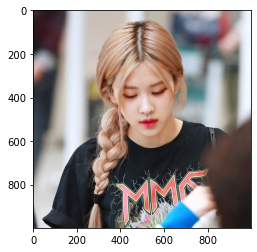

In [64]:
image = img.imread('C:\\Users\\Florence\\CompVision\\Face Detection\\img\\downward2.jpg')
plt.imshow(image)

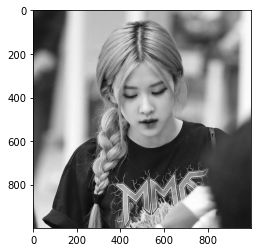

In [65]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

#plt.figure(figsize=(20,10))
plt.imshow(gray, cmap='gray')

In [66]:
faces = face_cascade.detectMultiScale(gray, 4,6)

In [67]:
print('HaarCascade found' + str(len(faces)) + ' faces in this image')

HaarCascade found1 faces in this image


In [68]:
img_with_detections = np.copy(image)

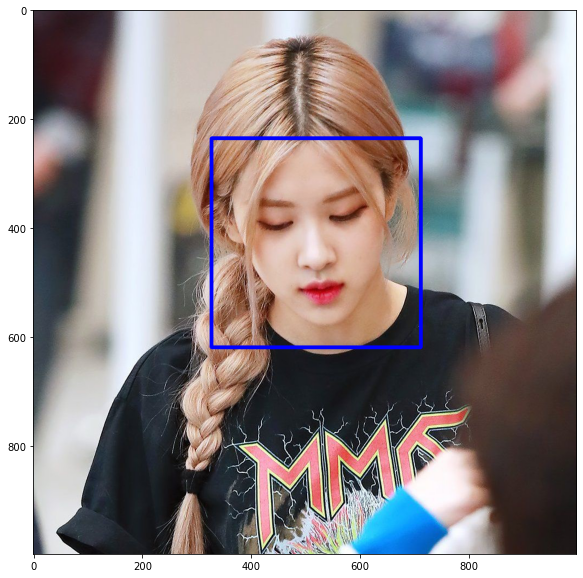

In [69]:
for (x,y,w,h) in faces:
    cv2.rectangle(img_with_detections,(x,y),(x+w,y+h),(0,0,255),5)
plt.figure(figsize=(20,10))
plt.imshow(img_with_detections)

In [70]:
img_with_prediction = np.copy(image)

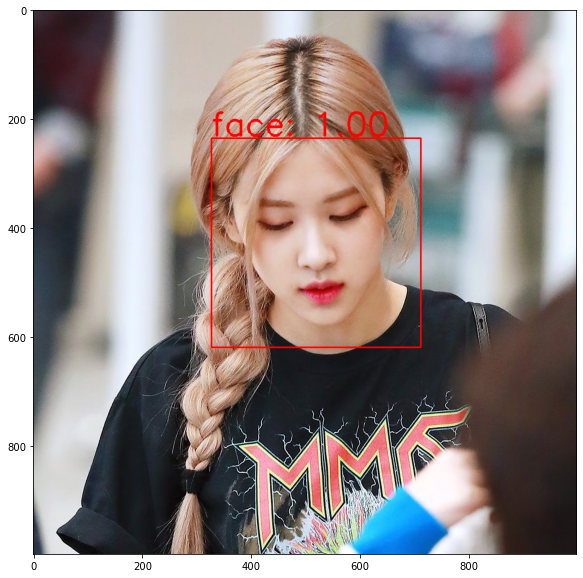

In [71]:
for (x,y,w,h) in faces:
    roi = img_with_prediction[y : y+h, x : x+w] #get region of interest
    data = cv2.resize(roi, img_size)/ 255. #resize image and flatten
    data = data.reshape((1,) + data.shape) #reshape the data to fit model
    scores = model.predict(data) #predict
    target = np.argmax(scores, axis=1)[0]
    
    cv2.rectangle(img=img_with_prediction, pt1=(x, y), pt2=(x+w, y+h), color=(255, 0, 0), thickness=2)
    text = "{}: {:.2f}".format(labels[target], scores[0][target])
    cv2.putText(img_with_prediction, text, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX,2, (255,0,0), 4)

plt.figure(figsize=(20,10))
plt.imshow(img_with_prediction)

### Haar Cascade and Inceptionv3 for Realtime Face Detection 

In [72]:
#pip install imutils

In [73]:
import sys
import imutils

In [119]:
video_capture = cv2.VideoCapture(0)

while True:
    ret, frame = video_capture.read()
    frame = imutils.resize(frame, width=850)
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
    faces = face_cascade.detectMultiScale(
        gray,
        scaleFactor=1.1,
        minNeighbors=5,
        minSize=(25,25)
    )
    for (x,y,w,h) in faces:
        roi = frame[y : y+h, x : x+w] 
        data = cv2.resize(roi, img_size)/ 255. 
        data = data.reshape((1,) + data.shape) 
        scores = model.predict(data) 
        target = np.argmax(scores, axis=1)[0]
    
        cv2.rectangle(img=frame, pt1=(x, y), pt2=(x+w, y+h), color=(255, 0, 0), thickness=2)
        text = "{}: {:.2f}".format(labels[target], scores[0][target])
        cv2.putText(frame, text, (x, y-5), cv2.FONT_HERSHEY_SIMPLEX,2, (255,0,0), 4)
    cv2.imshow('Haarcascade Realtime Detection', frame)
    
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
        
video_capture.release()
cv2.destroyAllWindows()

## MTCNN for Face Detection

In [80]:
#pip install --upgrade pip mtcnn

In [77]:
import mtcnn

In [78]:
face_detector = mtcnn.MTCNN()

### Frontal (close-up)

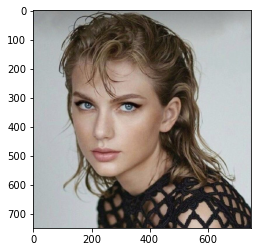

In [79]:
import matplotlib.image as img
img = img.imread("C:\\Users\\Florence\\CompVision\\Face Detection\\img\\frontal.jpg")
plt.imshow(img)

In [80]:
results = face_detector.detect_faces(img)
results

[{'box': [122, 141, 319, 442],
  'confidence': 0.9988253712654114,
  'keypoints': {'left_eye': (186, 322),
   'right_eye': (329, 328),
   'nose': (233, 422),
   'mouth_left': (193, 489),
   'mouth_right': (303, 492)}}]

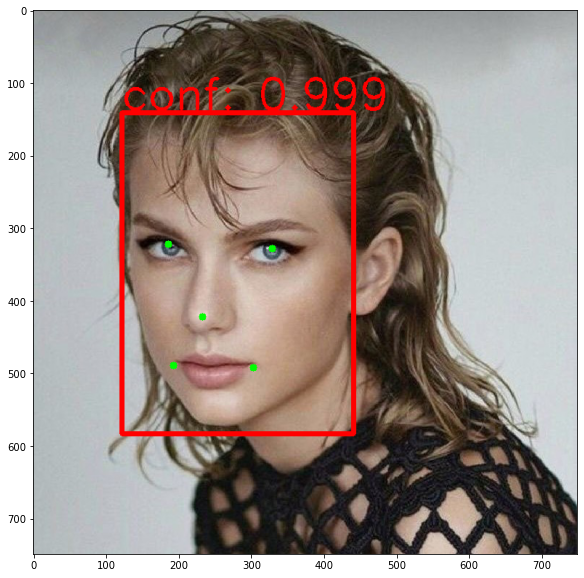

In [81]:
for res in results:
    x1,y1,w,h = res['box']
    x1,y1 = abs(x1), abs(y1)
    x2,y2 = x1+w, y1+h
    
    confidence = res['confidence']
    key_points = res['keypoints'].values()
    
    cv2.rectangle(img, (x1,y1), (x2,y2), (255, 0, 0), thickness=5)
    cv2.putText(img, f'conf: {confidence:.3f}', (x1,y1-5), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 0, 0), 4)
    
    for point in key_points:
        cv2.circle(img, point, 5, (0, 255, 0), thickness=-1)
        
plt.figure(figsize=(20,10))
plt.imshow(img)

### Frontal (not close-up) 

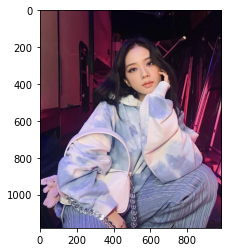

In [82]:
import matplotlib.image as img
img = img.imread("C:\\Users\\Florence\\CompVision\\Face Detection\\img\\frontal2.jpg")
plt.imshow(img)

In [83]:
results = face_detector.detect_faces(img)
results

[{'box': [449, 203, 218, 259],
  'confidence': 0.9999700784683228,
  'keypoints': {'left_eye': (505, 324),
   'right_eye': (594, 289),
   'nose': (562, 352),
   'mouth_left': (549, 410),
   'mouth_right': (615, 386)}}]

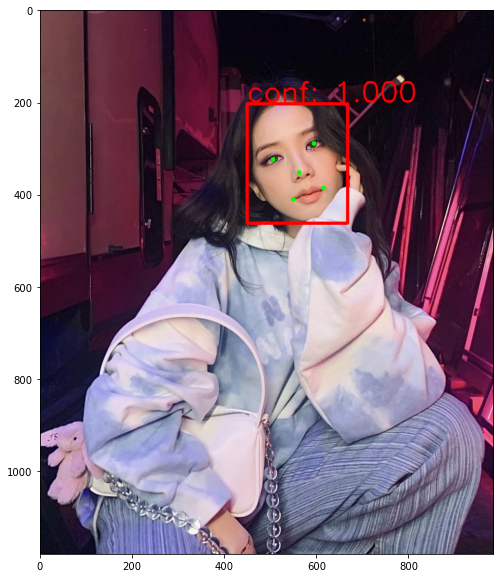

In [84]:
for res in results:
    x1,y1,w,h = res['box']
    x1,y1 = abs(x1), abs(y1)
    x2,y2 = x1+w, y1+h
    
    confidence = res['confidence']
    key_points = res['keypoints'].values()
    
    cv2.rectangle(img, (x1,y1), (x2,y2), (255, 0, 0), thickness=5)
    cv2.putText(img, f'conf: {confidence:.3f}', (x1,y1-5), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 0, 0), 4)
    
    for point in key_points:
        cv2.circle(img, point, 5, (0, 255, 0), thickness=-1)
        
plt.figure(figsize=(20,10))
plt.imshow(img)

### Occlusion 

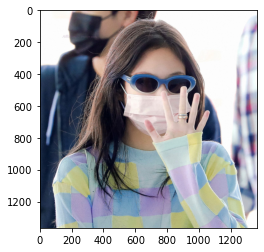

In [85]:
import matplotlib.image as img
img = img.imread("C:\\Users\\Florence\\CompVision\\Face Detection\\img\\occlusion.jpg")
plt.imshow(img)

In [86]:
results = face_detector.detect_faces(img)
results

[{'box': [531, 257, 344, 465],
  'confidence': 0.9954551458358765,
  'keypoints': {'left_eye': (668, 448),
   'right_eye': (846, 465),
   'nose': (757, 568),
   'mouth_left': (662, 641),
   'mouth_right': (810, 652)}}]

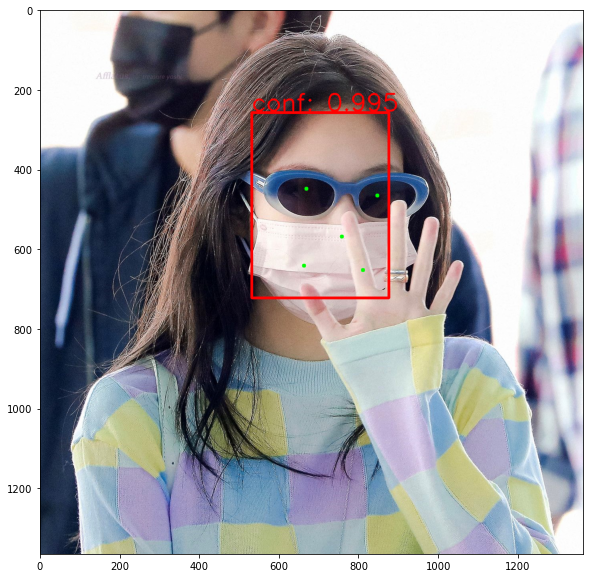

In [87]:
for res in results:
    x1,y1,w,h = res['box']
    x1,y1 = abs(x1), abs(y1)
    x2,y2 = x1+w, y1+h
    
    confidence = res['confidence']
    key_points = res['keypoints'].values()
    
    cv2.rectangle(img, (x1,y1), (x2,y2), (255, 0, 0), thickness=5)
    cv2.putText(img, f'conf: {confidence:.3f}', (x1,y1-5), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 0, 0), 4)
    
    for point in key_points:
        cv2.circle(img, point, 5, (0, 255, 0), thickness=-1)
        
plt.figure(figsize=(20,10))
plt.imshow(img)

### Occlusion 

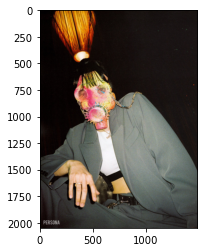

In [88]:
import matplotlib.image as img
img = img.imread("C:\\Users\\Florence\\CompVision\\Face Detection\\img\\occlusion2.jpg")
plt.imshow(img)

In [89]:
results = face_detector.detect_faces(img)
results

[{'box': [340, 609, 347, 417],
  'confidence': 0.9917271137237549,
  'keypoints': {'left_eye': (425, 751),
   'right_eye': (568, 748),
   'nose': (458, 850),
   'mouth_left': (435, 926),
   'mouth_right': (548, 921)}}]

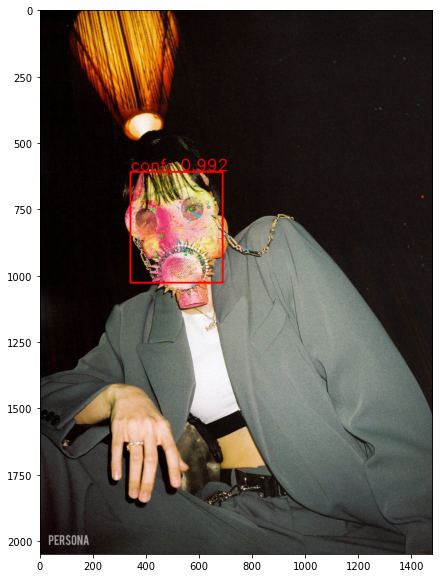

In [90]:
for res in results:
    x1,y1,w,h = res['box']
    x1,y1 = abs(x1), abs(y1)
    x2,y2 = x1+w, y1+h
    
    confidence = res['confidence']
    key_points = res['keypoints'].values()
    
    cv2.rectangle(img, (x1,y1), (x2,y2), (255, 0, 0), thickness=5)
    cv2.putText(img, f'conf: {confidence:.3f}', (x1,y1-5), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 0, 0), 4)
    
    for point in key_points:
        cv2.circle(img, point, 5, (0, 255, 0), thickness=-1)
        
plt.figure(figsize=(20,10))
plt.imshow(img)

### Face upward 

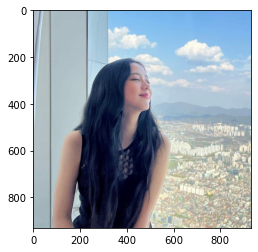

In [91]:
import matplotlib.image as img
img = img.imread("C:\\Users\\Florence\\CompVision\\Face Detection\\img\\upward.jpg")
plt.imshow(img)

In [92]:
results = face_detector.detect_faces(img)
results

[{'box': [387, 227, 128, 191],
  'confidence': 0.9976029992103577,
  'keypoints': {'left_eye': (442, 293),
   'right_eye': (500, 294),
   'nose': (491, 325),
   'mouth_left': (453, 365),
   'mouth_right': (498, 366)}}]

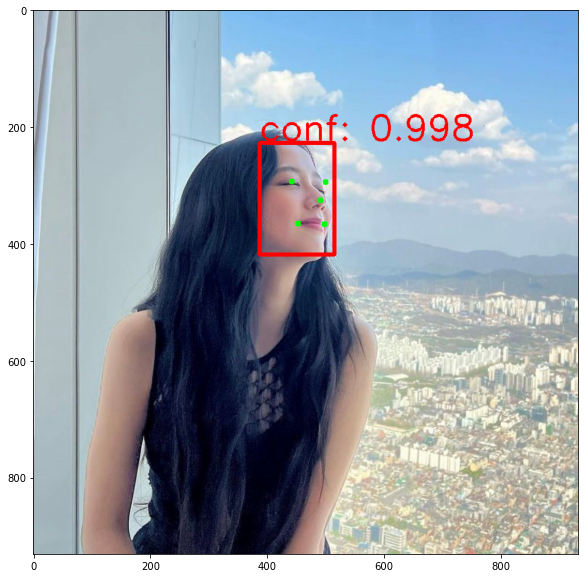

In [93]:
for res in results:
    x1,y1,w,h = res['box']
    x1,y1 = abs(x1), abs(y1)
    x2,y2 = x1+w, y1+h
    
    confidence = res['confidence']
    key_points = res['keypoints'].values()
    
    cv2.rectangle(img, (x1,y1), (x2,y2), (255, 0, 0), thickness=5)
    cv2.putText(img, f'conf: {confidence:.3f}', (x1,y1-5), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 0, 0), 4)
    
    for point in key_points:
        cv2.circle(img, point, 5, (0, 255, 0), thickness=-1)
        
plt.figure(figsize=(20,10))
plt.imshow(img)

### Face upward 

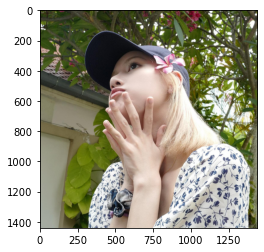

In [94]:
import matplotlib.image as img
img = img.imread("C:\\Users\\Florence\\CompVision\\Face Detection\\img\\upward2.jpg")
plt.imshow(img)

In [95]:
results = face_detector.detect_faces(img)
results

[{'box': [432, 259, 360, 409],
  'confidence': 0.8187329173088074,
  'keypoints': {'left_eye': (495, 421),
   'right_eye': (624, 389),
   'nose': (491, 448),
   'mouth_left': (496, 573),
   'mouth_right': (588, 554)}},
 {'box': [2, 248, 50, 48],
  'confidence': 0.8163941502571106,
  'keypoints': {'left_eye': (24, 266),
   'right_eye': (37, 274),
   'nose': (27, 280),
   'mouth_left': (16, 279),
   'mouth_right': (26, 286)}}]

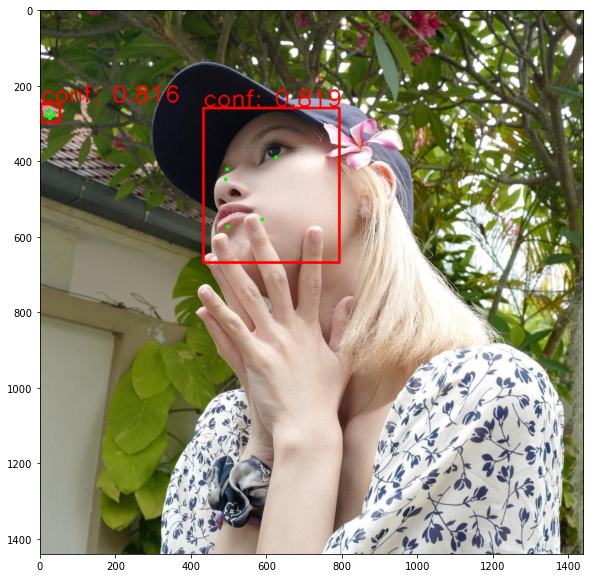

In [96]:
for res in results:
    x1,y1,w,h = res['box']
    x1,y1 = abs(x1), abs(y1)
    x2,y2 = x1+w, y1+h
    
    confidence = res['confidence']
    key_points = res['keypoints'].values()
    
    cv2.rectangle(img, (x1,y1), (x2,y2), (255, 0, 0), thickness=5)
    cv2.putText(img, f'conf: {confidence:.3f}', (x1,y1-5), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 0, 0), 4)
    
    for point in key_points:
        cv2.circle(img, point, 5, (0, 255, 0), thickness=-1)
        
plt.figure(figsize=(20,10))
plt.imshow(img)

### Face downward 

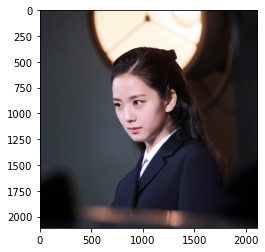

In [97]:
import matplotlib.image as img
img = img.imread("C:\\Users\\Florence\\CompVision\\Face Detection\\img\\downward.jpg")
plt.imshow(img)

In [98]:
results = face_detector.detect_faces(img)
results

[{'box': [700, 637, 491, 661],
  'confidence': 0.9999985694885254,
  'keypoints': {'left_eye': (764, 919),
   'right_eye': (945, 890),
   'nose': (828, 1052),
   'mouth_left': (843, 1160),
   'mouth_right': (985, 1135)}}]

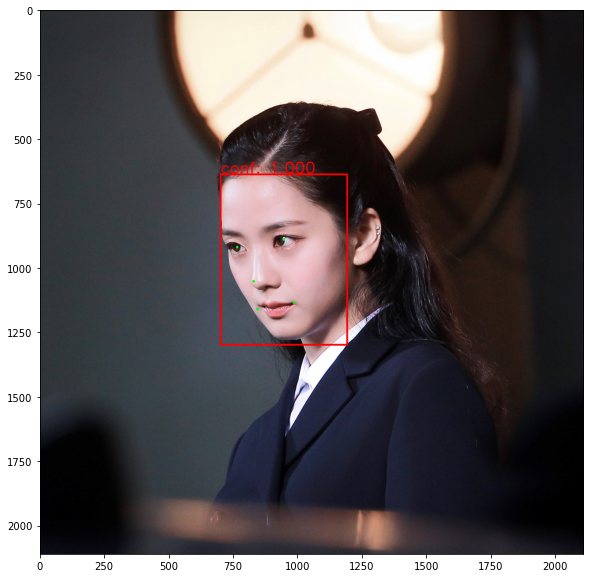

In [99]:
for res in results:
    x1,y1,w,h = res['box']
    x1,y1 = abs(x1), abs(y1)
    x2,y2 = x1+w, y1+h
    
    confidence = res['confidence']
    key_points = res['keypoints'].values()
    
    cv2.rectangle(img, (x1,y1), (x2,y2), (255, 0, 0), thickness=5)
    cv2.putText(img, f'conf: {confidence:.3f}', (x1,y1-5), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 0, 0), 4)
    
    for point in key_points:
        cv2.circle(img, point, 5, (0, 255, 0), thickness=-1)
        
plt.figure(figsize=(20,10))
plt.imshow(img)

### Face downward 

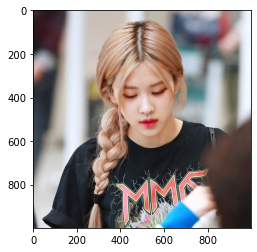

In [100]:
import matplotlib.image as img
img = img.imread("C:\\Users\\Florence\\CompVision\\Face Detection\\img\\downward2.jpg")
plt.imshow(img)

In [101]:
results = face_detector.detect_faces(img)
results

[{'box': [383, 247, 265, 350],
  'confidence': 0.99967360496521,
  'keypoints': {'left_eye': (453, 394),
   'right_eye': (571, 374),
   'nose': (519, 462),
   'mouth_left': (479, 520),
   'mouth_right': (579, 505)}}]

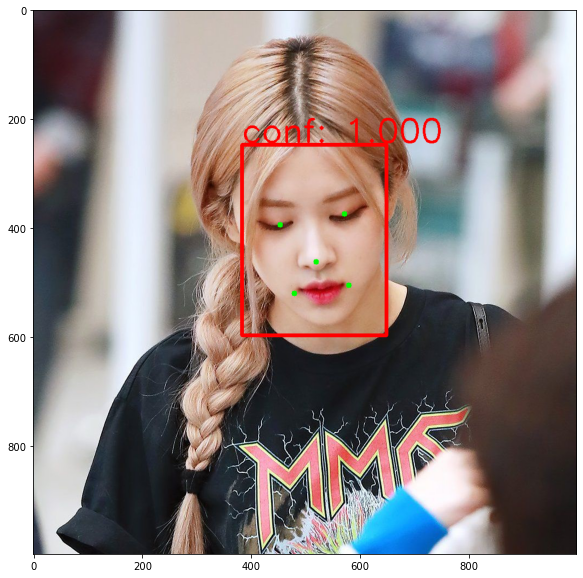

In [102]:
for res in results:
    x1,y1,w,h = res['box']
    x1,y1 = abs(x1), abs(y1)
    x2,y2 = x1+w, y1+h
    
    confidence = res['confidence']
    key_points = res['keypoints'].values()
    
    cv2.rectangle(img, (x1,y1), (x2,y2), (255, 0, 0), thickness=5)
    cv2.putText(img, f'conf: {confidence:.3f}', (x1,y1-5), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 0, 0), 4)
    
    for point in key_points:
        cv2.circle(img, point, 5, (0, 255, 0), thickness=-1)
        
plt.figure(figsize=(20,10))
plt.imshow(img)

### MTCNN for Real-time Face Detection 

In [121]:
face_detector = mtcnn.MTCNN()
vc = cv2.VideoCapture(0)
conf_t = 0.99

while vc.isOpened():
    ret, frame = vc.read()
    if not ret:
        print(':(')
        break
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    results = face_detector.detect_faces(frame_rgb)
    for res in results:
        x1, y1, width, height = res['box']
        x1, y1 = abs(x1), abs(y1)
        x2, y2 = x1 + width, y1 + height

        confidence = res['confidence']
        if confidence < conf_t:
            continue
        key_points = res['keypoints'].values()

        cv2.rectangle(frame, (x1, y1), (x2, y2), (255, 0, 0), thickness=2)
        cv2.putText(frame, f'conf: {confidence:.3f}', (x1, y1), cv2.FONT_ITALIC, 1, (0, 0, 255), 1)

        for point in key_points:
            cv2.circle(frame, point, 5, (0, 255, 0), thickness=-1)

    cv2.imshow('smile', frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
        
vc.release()
cv2.destroyAllWindows()